# Getting Concept Contrast Maps

## Utilities

In [1]:
import sys
#!{sys.executable} -m pip install numpy
#!{sys.executable} -m pip install scipy
#!{sys.executable} -m pip install matplotlib
#!{sys.executable} -m pip install h5py
#!{sys.executable} -m pip install nibabel
#!{sys.executable} -m pip install opencv-python
#!{sys.executable} -m pip install pycocotools
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import h5py
import nibabel as nib
import cv2
from pycocotools.coco import COCO
import time
import collections
import csv
from PIL import Image
#import multiprocessing as mp

Function to get numpy.memmap from .nii files. fdata() gives 64-bit floats. 

In [2]:
def load_from_nii(mask_nii_file):
    return nib.load(mask_nii_file).get_fdata()

# Viewing the voxel images

In [3]:
session_1 = load_from_nii('betas/subj01/betas_session01.nii')

session_1.shape

(81, 104, 83, 750)

We have 3D images with x, y, and z dimesions of length 81, 104, and 83. This means there are 699192 voxels per scan. Last index is the image being shown.

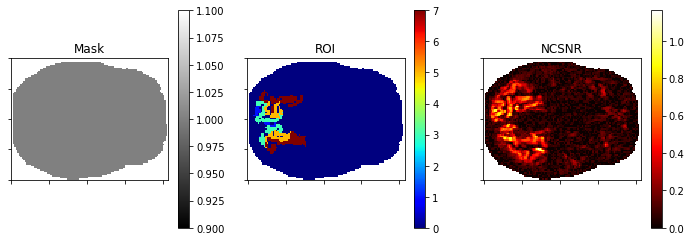

In [5]:
#need to generalize to arbitrary subject

#load masks
voxel_mask_full = load_from_nii("masks/subj01/brainmask.nii") #The binary brain mask that was used to mask the betas (in order to save disk space). Note that this brain mask is intentionally liberal so as to not lose brain voxels.
voxel_roi_full  = load_from_nii("masks/subj01/prf-visualrois.nii") #‘prf-visualrois’ is a collection of manually drawn ROIs based on results of the prf experiment
voxel_kast_full = load_from_nii("masks/subj01/Kastner2015.nii") #'Kastner2015’ is the Wang et al., Cerebral Cortex, 2015 atlas.
general_mask_full  = load_from_nii("masks/subj01/nsdgeneral.nii") #‘nsdgeneral’ is a general ROI that was manually drawn on fsaverage covering voxels
ncsnr_full = load_from_nii("masks/subj01/ncsnr.nii")

###
#b=50
#plt.imshow(voxel_mask_full[:,:,b], cmap='hot', interpolation='None')
#print("voxel_mask_full")
#plt.show()
#plt.imshow(voxel_roi_full[:,:,b], cmap='hot', interpolation='None')
#print("voxel_roi_full")
#plt.show()
#plt.imshow(voxel_kast_full[:,:,b], cmap='hot', interpolation='None')
#print("voxel_kast_full")
#plt.show()
#plt.imshow(general_mask_full[:,:,b], cmap='hot', interpolation='None')
#print("general_mask_full")
#plt.show()
#plt.imshow(ncsnr_full[:,:,b], cmap='hot', interpolation='None')
#print("ncsnr_full")
#plt.show()
###
brain_nii_shape = voxel_roi_full.shape
#print(brain_nii_shape)
###
voxel_roi_mask_full = (voxel_roi_full>0).flatten().astype(bool)
voxel_joined_roi_full = np.copy(voxel_kast_full.flatten())  # load kastner rois
voxel_joined_roi_full[voxel_roi_mask_full] = voxel_roi_full.flatten()[voxel_roi_mask_full] # overwrite with prf rois
###
voxel_mask  = np.nan_to_num(voxel_mask_full).flatten().astype(bool)
voxel_idx   = np.arange(len(voxel_mask))[voxel_mask]
voxel_roi   = voxel_joined_roi_full[voxel_mask]
voxel_ncsnr = ncsnr_full.flatten()[voxel_mask]

#print('full mask length = %d'%len(voxel_mask))
#print('selection length = %d'%np.sum(voxel_mask))

def view_data(vol_shape, idx_mask, data_vol, order='C'): #, save_to=None):
    view_vol = np.ones(np.prod(vol_shape), dtype=np.float32) * np.nan
    view_vol[idx_mask.astype('int').flatten()] = data_vol
    view_vol = view_vol.reshape(vol_shape, order=order)
    #if save_to:
        #nib.save(nib.Nifti1Image(view_vol, affine=np.eye(4)), save_to)
    return view_vol

#Next cell
slice_idx = 35
plt.figure(figsize=(12, 4))
    
volume_brain_mask = view_data(brain_nii_shape, voxel_idx, np.ones_like(voxel_idx))#, save_to=output_dir+"subj%02d_mask"%subject)
volume_brain_roi  = view_data(brain_nii_shape, voxel_idx, voxel_roi)#, save_to=output_dir+"subj%02d_roi"%subject)
volume_ncsnr      = view_data(brain_nii_shape, voxel_idx, voxel_ncsnr)#, save_to=output_dir+"subj%02d_ncsnr"%subject) 
##
plt.subplot(1,3,1)
plt.imshow(volume_brain_mask[:,:,slice_idx], cmap='gray', interpolation='None')
plt.title('Mask')
plt.colorbar()
_=plt.gca().set_xticklabels([])
_=plt.gca().set_yticklabels([])
plt.subplot(1,3,2)
plt.imshow(volume_brain_roi[:,:,slice_idx], cmap='jet', interpolation='None')
plt.clim([0,7])
plt.title('ROI')
plt.colorbar()
_=plt.gca().set_xticklabels([])
_=plt.gca().set_yticklabels([])
plt.subplot(1,3,3)
plt.imshow(volume_ncsnr[:,:,slice_idx], cmap='hot', interpolation='None')
plt.title('NCSNR')
plt.colorbar()
_=plt.gca().set_xticklabels([])
_=plt.gca().set_yticklabels([])

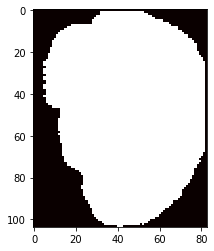

In [6]:
plt.imshow(voxel_mask_full[50,:,:], cmap='hot', interpolation='None')
plt.show()

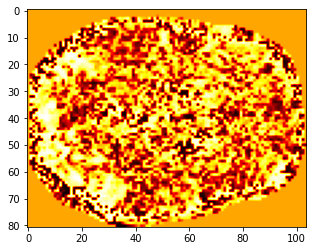

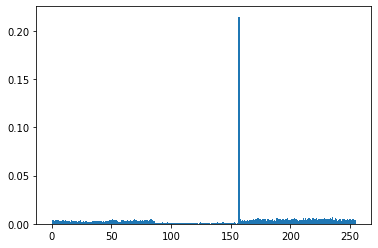

In [7]:
def histogram_equalization(image, number_bins=256):
    # get image histogram
    image_histogram, bins = np.histogram(image.flatten(), number_bins, density=True)
    cdf = image_histogram.cumsum() # cumulative distribution function
    cdf = 255 * cdf / cdf[-1] # normalize
    # use linear interpolation of cdf to find new pixel values
    image_equalized = np.interp(image.flatten(), bins[:-1], cdf)
    return image_equalized.reshape(image.shape)

plt.imshow(histogram_equalization(session_1[:,:,40,400]), cmap='hot')
plt.show()
plt.hist(histogram_equalization(session_1[:,:,40,400]).flatten(),256,density=True)
plt.show()

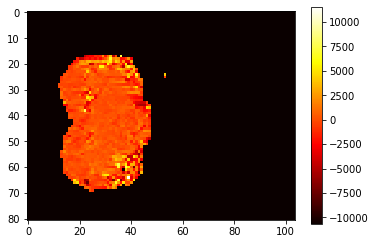

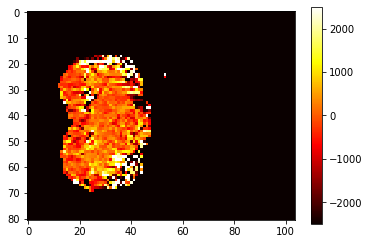

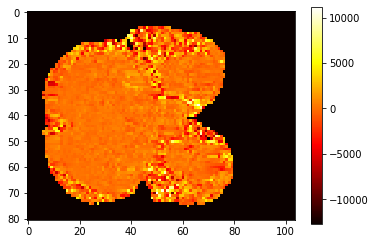

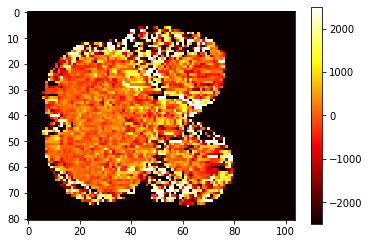

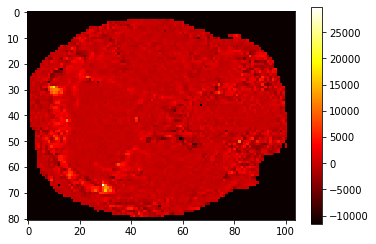

...

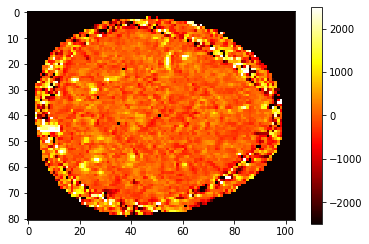

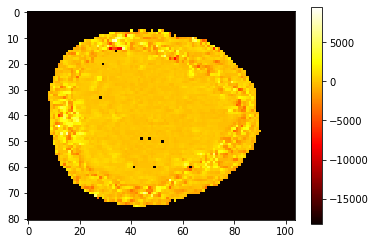

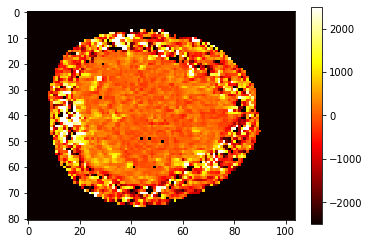

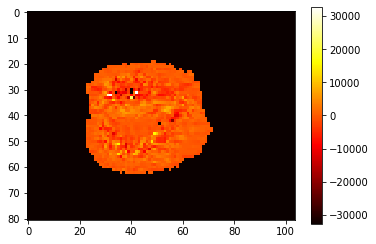

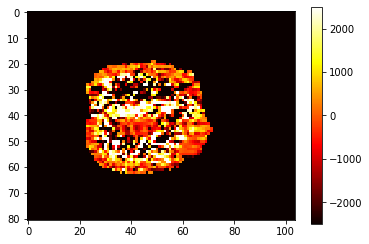

In [9]:
for i in [10,20,30,40,50,60,70,80]:
    image = session_1[:,:,i,400]
    minimum = np.min(image)
    image = np.where(image == 0, minimum, image)
    plt.imshow(image, vmin=minimum+1, cmap='hot', interpolation='None')
    plt.colorbar()
    plt.show()
    plt.imshow(image, vmin=-2500, vmax=2500, cmap='hot', interpolation='None')
    plt.colorbar()
    plt.show()
    #plt.hist(image.flatten(), bins=256, range=[-3000,1000])
    #plt.show()

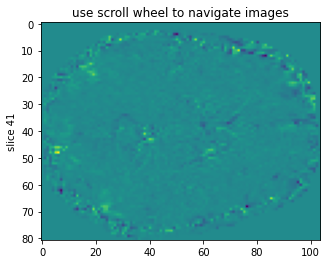

In [10]:
class IndexTracker:
    def __init__(self, ax, X):
        self.ax = ax
        ax.set_title('use scroll wheel to navigate images')

        self.X = X
        rows, cols, self.slices = X.shape
        self.ind = self.slices//2

        self.im = ax.imshow(self.X[:, :, self.ind])
        self.update()

    def on_scroll(self, event):
        print("%s %s" % (event.button, event.step))
        if event.button == 'up':
            self.ind = (self.ind + 1) % self.slices
        else:
            self.ind = (self.ind - 1) % self.slices
        self.update()

    def update(self):
        self.im.set_data(self.X[:, :, self.ind])
        self.ax.set_ylabel('slice %s' % self.ind)
        self.im.axes.figure.canvas.draw()


fig, ax = plt.subplots(1, 1)

X = session_1[:,:,:,40]

tracker = IndexTracker(ax, X)


fig.canvas.mpl_connect('scroll_event', tracker.on_scroll)
plt.show()

# Contrast map for specified label

In [3]:
subject = 1

exp_design = scipy.io.loadmat('nsd_expdesign.mat')
ordering = exp_design['masterordering'].flatten() - 1 #fix indexing
trials = np.array([30000, 30000, 24000, 22500, 30000, 24000, 30000, 22500])
data_size = trials[subject-1]
ordering_data = ordering[:data_size]

f = h5py.File('S'+str(subject)+'_stimuli_227.h5py','r')
images = f['stimuli']

def index_to_image(my_index):
    index = ordering[my_index]
    image = images[index,:,:,:]
    return np.transpose(image, (1,2,0))

Note: need to download annotation files from command line using wget. Don't upload from local machine.

In [4]:
subject = 1

coco = COCO('annotations/instances_train2017.json')
coco2 = COCO('annotations/instances_val2017.json')

exp_design = scipy.io.loadmat('nsd_expdesign.mat')
ordering = exp_design['masterordering'].flatten() - 1 #fix indexing
trials = np.array([30000, 30000, 24000, 22500, 30000, 24000, 30000, 22500])
data_size = trials[subject-1]
ordering_data = ordering[:data_size]
subjectim = exp_design['subjectim'] - 1

def load_csv(csv_file):
    file = open(csv_file)
    csvreader = csv.reader(file)
    header = next(csvreader)
    rows = []
    for row in csvreader:
        rows.append(row)
    file.close()
    return rows

nsd_to_coco = load_csv('nsd_stim_info_merged.csv')

def index_to_label(my_index):
    index = ordering_data[my_index]
    nsd_id = subjectim[subject-1,index]
    coco_id = nsd_to_coco[nsd_id][1]
    
    img_id_train = []
    img_id_val = []
    if int(nsd_id) < 2950:
        img_id_val.append(int(coco_id))
    else:
        img_id_train.append(int(coco_id))
    local = collections.Counter()
    if len(img_id_train) != 0:
        annotation_ids = coco.getAnnIds(img_id_train)
        annotations = coco.loadAnns(annotation_ids)
        for i in range(len(annotations)):
            entity_id = annotations[i]["category_id"]
            entity = coco.loadCats(entity_id)[0]["name"]
            local[entity] += 1
    if len(img_id_val) != 0:
        annotation_ids = coco2.getAnnIds(img_id_val)
        annotations = coco2.loadAnns(annotation_ids)
        for i in range(len(annotations)):
            entity_id = annotations[i]["category_id"]
            entity = coco2.loadCats(entity_id)[0]["name"]
            local[entity] += 1
    return local

loading annotations into memory...
Done (t=23.59s)
creating index...
index created!
loading annotations into memory...
Done (t=0.67s)
creating index...
index created!


In [13]:
start = time.time()

positive_indices = []
negative_indices = []
for i in range(30000):
    count = index_to_label(i)['pizza']
    if count > 0:
        positive_indices.append(i)
    if count == 0:
        negative_indices.append(i)

print("DONE")
print(time.time() - start)

DONE
0.9849765300750732


777
29223


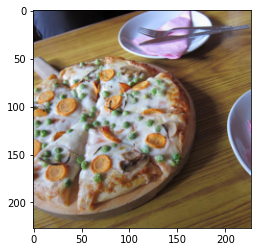

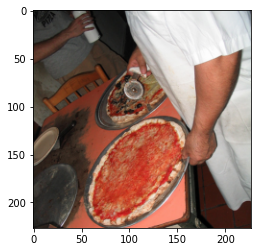

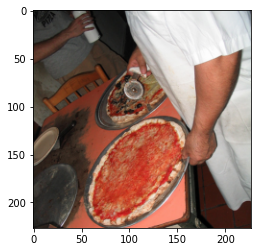

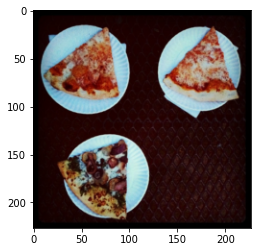

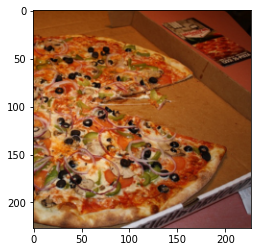

...

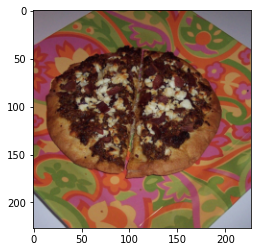

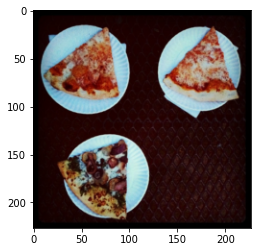

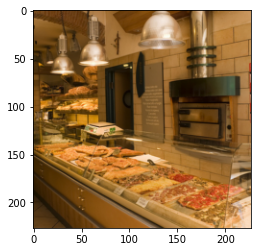

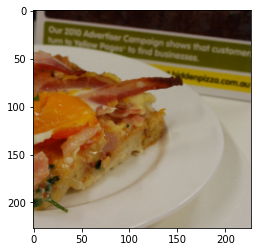

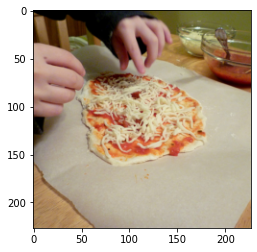

In [14]:
print(len(positive_indices))
print(len(negative_indices))
for thing in positive_indices[:50]:
    plt.imshow(index_to_image(thing))
    plt.show()

In [15]:
loaded_data, loaded_session = None, 0

def get_contrast_map(positive_indices, negative_indices):
    whole = time.time()
    start = time.time()
    positive_resultant = np.zeros((81,104,83))
    negative_resultant = np.zeros((81,104,83))
    global loaded_data
    global loaded_session
    guide = {}
    for positive_index in positive_indices:
        guide[positive_index] = True
    for negative_index in negative_indices:
        guide[negative_index] = False
    combined = positive_indices + negative_indices
    combined.sort()
    print(time.time() - start)
    for index in combined:
        
        session = index//750 + 1 #RUN A TEST TO MAKE SURE YOU DID THIS CORRECTLY
        within_session_index = index % 750
        
        if session != loaded_session:
            start = time.time()
            if session < 10:
                loaded_data = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session = session
            else:
                loaded_data = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session = session
            print(time.time()-start)
    
        if guide[index]:
            positive_resultant = positive_resultant + loaded_data[:,:,:,within_session_index]
        if not guide[index]:
            negative_resultant = negative_resultant + loaded_data[:,:,:,within_session_index]
            
    positive_resultant = positive_resultant / len(positive_indices)
    negative_resultant = negative_resultant / len(negative_indices)
    print(time.time()-whole)
    return positive_resultant - negative_resultant    

In [16]:
average_pizza_representation = get_contrast_map(positive_indices, negative_indices)

0.01069021224975586
8.43032431602478
31.402745485305786
20.69339418411255
20.62717318534851
21.616281986236572
31.257060289382935
31.501545429229736
24.725160360336304
18.825438499450684
19.645060062408447
20.56027054786682
19.928794384002686
20.543139457702637
22.95543932914734
20.304776668548584
22.01640009880066
20.138513803482056
19.558778762817383
19.978993892669678
22.15365481376648
21.771944999694824
21.082615852355957
20.421084880828857
23.22725009918213
22.552154302597046
26.828678846359253
22.76081871986389
20.901753664016724
22.125493049621582
22.34518790245056
22.01811671257019
26.73760747909546
26.353286743164062
23.354239463806152
19.856430530548096
23.477157831192017
22.31445574760437
21.44061279296875
24.63455820083618
22.74160885810852
1060.76522564888


slice 27


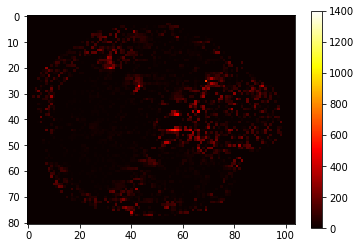

slice 28


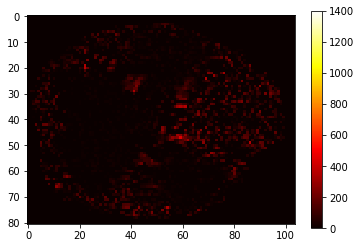

slice 29


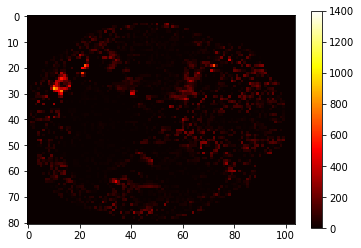

slice 30


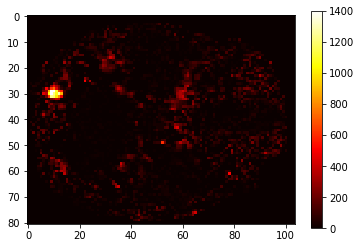

slice 31


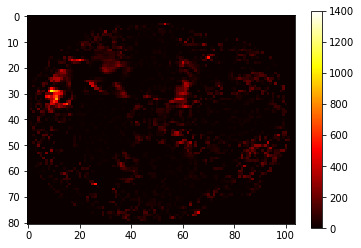

slice 32


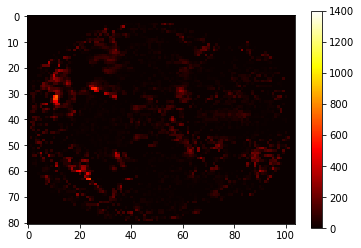

slice 33


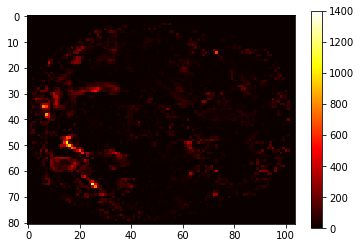

slice 34


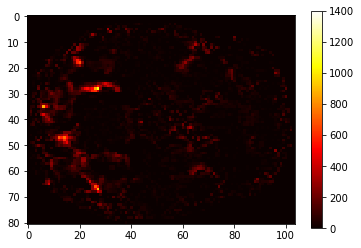

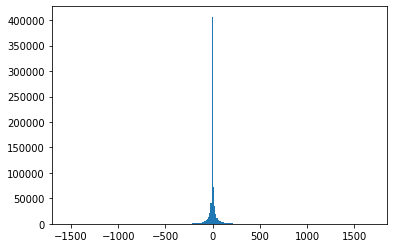

(27, 27, 35)
(29, 9, 30)
(29, 10, 30)
(30, 9, 30)
(30, 10, 30)
(30, 12, 30)
(31, 9, 30)
7
1682.4636719080809


In [20]:
for num in [27,28,29,30,31,32,33,34]:
    average_pizza_representation_fixed = np.where(average_pizza_representation == 0, -1001, average_pizza_representation)
    print("slice "+str(num))
    plt.imshow(average_pizza_representation_fixed[:,:,num], cmap='hot', vmin=0, vmax=1400, interpolation='None')
    plt.colorbar()
    plt.show()
    
plt.hist(average_pizza_representation.flatten(), bins=255)
plt.show()

count = 0 
for x in range(average_pizza_representation.shape[0]):
    for y in range(average_pizza_representation.shape[1]):
        for z in range(average_pizza_representation.shape[2]):
            if average_pizza_representation[x,y,z] > 1200:
                count+=1
                print('('+str(x)+', '+str(y)+', '+str(z)+')')
print(count)

print(np.amax(average_pizza_representation))

Computation note: It takes about 25 seconds to re-load a beta session. In the limit of lots of data, this means that switching between beta sessions will take at most 40x25 seconds or about 16 minutes. Therefore, we can expect 16 minutes per concept, though it does seem possible to parallelize across concepts (and have the entire computation take 16 minutes). It's also worth exploring how to hasten loading (and deleting) of beta sessions. Can also do all computations within beta files separately and then aggregate. 

In [35]:
all_labels = collections.Counter()
for i in range(30000):
    all_labels.update(index_to_label(i))

all_labels = list(all_labels.keys())
all_labels.sort()
for key in all_labels:
    print(key)

airplane
apple
backpack
banana
baseball bat
baseball glove
bear
bed
bench
bicycle
bird
boat
book
bottle
bowl
broccoli
bus
cake
car
carrot
cat
cell phone
chair
clock
couch
cow
cup
dining table
dog
donut
elephant
fire hydrant
fork
frisbee
giraffe
hair drier
handbag
horse
hot dog
keyboard
kite
knife
laptop
microwave
motorcycle
mouse
orange
oven
parking meter
person
pizza
potted plant
refrigerator
remote
sandwich
scissors
sheep
sink
skateboard
skis
snowboard
spoon
sports ball
stop sign
suitcase
surfboard
teddy bear
tennis racket
tie
toaster
toilet
toothbrush
traffic light
train
truck
tv
umbrella
vase
wine glass
zebra


In [28]:
mp.cpu_count()

14

In [66]:
loaded_data_all, loaded_session_all = None, 0

def get_all_contrast_maps():
    #getting alphabetized list of the 80 labels
    all_labels = collections.Counter()
    for i in range(30000):
        all_labels.update(index_to_label(i))
    all_labels = list(all_labels.keys())
    all_labels.sort()
    
    #getting label counts into a giant matrix
    guide = np.empty((80,30000))
    for trial in range(30000):
        label_counter = index_to_label(trial)
        for index, label in enumerate(all_labels):
            label_count = label_counter[label]
            guide[index,trial] = label_count
    
    positive_resultant = np.zeros((81,104,83,80))
    negative_resultant = np.zeros((81,104,83,80))
    global loaded_data_all
    global loaded_session_all
    
    positive_denominators = np.zeros(80)
    negative_denominators = np.zeros(80)
    for session in range(40):
        
        time_3 = time.time()
        
        session += 1
        if session != loaded_session_all:
            if session < 10:
                loaded_data_all = load_from_nii("betas/subj0"+str(subject)+"/betas_session0"+str(session)+".nii")
                loaded_session_all = session
            else:
                loaded_data_all = load_from_nii("betas/subj0"+str(subject)+"/betas_session"+str(session)+".nii")
                loaded_session_all = session
        trial_end = 750*session
        trial_start = trial_end - 750
        for label_index in range(80):
            row = guide[label_index,trial_start:trial_end]
            positive_condition = (row > 0)
            negative_condition = (row == 0)
            for positive in positive_condition:
                positive_denominators[label_index] += 1
            for negative in negative_condition:
                negative_denominators[label_index] += 1
            local_positive_resultant = np.sum(loaded_data_all[:,:,:,positive_condition], axis=3)
            local_negative_resultant = np.sum(loaded_data_all[:,:,:,negative_condition], axis=3)
            #for trial in range(trial_start, trial_end):
                #within_session_trial = trial % 750
                #count = guide[label_index,trial]
                #if positive_criterion(count):
                #    positive_denominators[label_index] += 1
                #    positive_resultant[:,:,:,label_index] = positive_resultant[:,:,:,label_index] + loaded_data_all[:,:,:,mod_trial]
                #    local_positive_resultant = local_positive_resultant + loaded_data_all[:,:,:,mod_trial]
                #if negative_criterion(count):
                #    negative_denominators[label_index] += 1
                #    negative_resultant[:,:,:,label_index] = negative_resultant[:,:,:,label_index] + loaded_data_all[:,:,:,mod_trial]
                #    local_negative_resultant = local_negative_resultant + loaded_data_all[:,:,:,mod_trial]
            
            positive_resultant[:,:,:,label_index] = positive_resultant[:,:,:,label_index] + local_positive_resultant
            negative_resultant[:,:,:,label_index] = negative_resultant[:,:,:,label_index] + local_negative_resultant
        print((time.time() - time_3)/60)
                    
    positive_resultant = positive_resultant.astype('float')
    negative_resultant = negative_resultant.astype('float')
    
    for label_index in range(80):
        if positive_denominators[label_index] != 0:
            positive_resultant[:,:,:,label_index] = positive_resultant[:,:,:,label_index] / positive_denominators[label_index]
        if negative_denominators[label_index] != 0:
            negative_resultant[:,:,:,label_index] = negative_resultant[:,:,:,label_index] / negative_denominators[label_index]
    
    return positive_resultant - negative_resultant    

In [67]:
all_contrast_maps = get_all_contrast_maps()

3.854816508293152
3.511822005112966
3.5104367176691693
3.3700808842976886
3.489678617318471
3.4607471307118733
3.697215286890666
3.500963640213013
3.6331495086352033
3.543878471851349
3.660162897904714
3.522968018054962
3.641100271542867
3.5335172454516095
3.7089330275853474
3.600140023231506
3.67196204662323
3.621771049499512
3.5815928896268208
3.50593874057134
3.64225990374883
3.6881288925806683
3.6385401686032615
3.5958082993825276
3.557294611136119
3.6822494824727374
3.656306195259094
3.6196989893913267
3.601336868604024
3.5510416984558106
3.7414009253184
3.4916256189346315
3.700674835840861
3.605351897080739
3.6963787198066713
3.5857140024503074
3.8031981627146405
3.6263187567392987
3.5847429235776267
3.525577159722646


In [92]:
#contrast_maps_image = nib.Nifti1Image(all_contrast_maps, affine=np.eye(4))
#nib.save(contrast_maps_image, 'all_contrast_maps.nii')

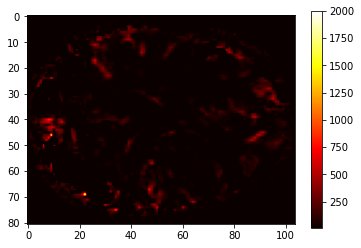

In [123]:

plt.imshow(all_contrast_maps[:,:,50,65], cmap='hot', vmin=5, vmax=2000)
plt.colorbar()
plt.show()

In [145]:
np.unravel_index(np.argmin(all_contrast_maps), all_contrast_maps.shape)
#np.amin(all_contrast_maps)

(29, 10, 30, 69)

In [137]:
all_labels = collections.Counter()
for i in range(30000):
    all_labels.update(index_to_label(i))
all_labels = list(all_labels.keys())
all_labels.sort()

all_labels[69]

'toaster'

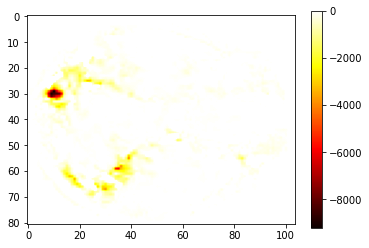

In [143]:
plt.imshow(all_contrast_maps[:,:,30,69], cmap='hot', vmax=0)
plt.colorbar()
plt.show()

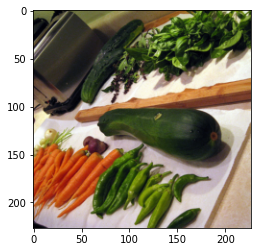

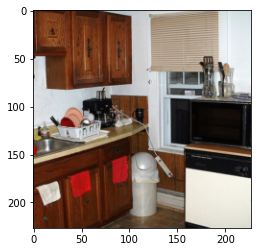

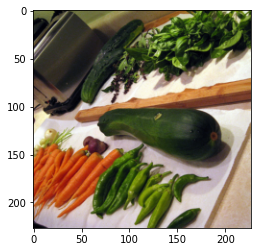

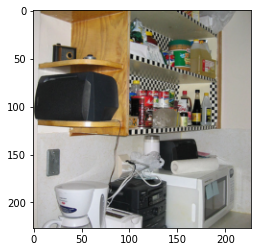

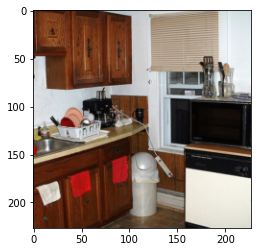

...

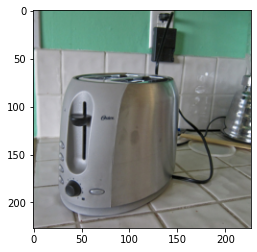

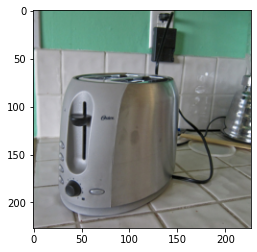

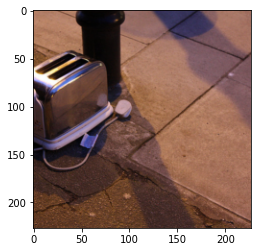

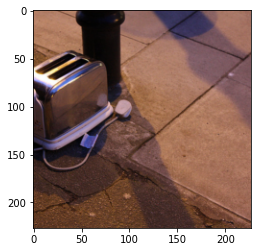

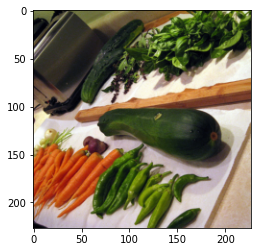

In [147]:
for i in range(30000):
    count = index_to_label(i)['toaster']
    if count > 0:
        plt.imshow(index_to_image(i))
        plt.show()


# Improvements

--Visualizing 3D brain scans effectively

--Finding representative images (semantic weighting, human feedback, using different annotations/sentence embeddings)

--Watch out for spatial alignment between brains before doing addition

--Watch out for coupling of semantic categories

--Using encoding model as de-noiser

#### Directions

--Contrast maps as unit vectors of brain space

--Additive compositionaliy hypothesis

--PCA the contrast maps and analyze representations, maybe using word embeddings

--(maybe distilling the concepts to one vector is a mistake)

--Look at if and only if for certain regions

--Differences between individuals in the exact location of, say, pizza